# Online System Identification and Learning Control via NN bases 

1. **Loop Through Episodes**: For each episode of training or evaluation:
   
   2. **Initialization**: 
      - Randomly initialize the system state.

   3. **Neural Network Training**: 
      - If it's not the first episode, update the neural network model, i.e, update bases and model paramters.

   4. **Loop Through Time Steps**: For each time step:
      
      - **Update the System Model**: Integrate (i.e. step) the system model using the current control input and the state observations.
      
      - **Check Sample Validity and Add to Training or Validation Database**: Ensure the sensor data is within the valid range; if not, stop the process.
      
      - **Calculate Derivatives**: If there are enough previous samples, compute the approximate and predicted state derivatives, and track the error.

      - **Update the Controller**: Adjust the controller parameters based on the current state and calculate the new control input.

      - **Log Progress**: Record the observations and Periodically print the progress of the simulation.

5. **Save Data and Generate Graphs**: After all time steps, save the training database and generate graphs to visualize the results of the episode.






SysID: 

$$
\dot{x}=W\Phi +\sum_{j=1}^{m} W_j\Phi u_j
$$

where $W$ and $W_j\in{\rm I\!R}^{n\times p}$ are matrices of coefficients. $\Phi_{NN}(x,\theta)$ is a $p$-diemensional paramterized vector of basis functions using DNN.

For system Identification, we train $W,W_j$ and $\Phi$.

Control:

Integrate
$$
-\dot{P}=\bar{Q}+P\frac{\partial{\Phi }}{\partial{x}}W+W^T\frac{\partial{\Phi }}{\partial{x}}^TP-\gamma P
-P\frac{\partial{\Phi }}{\partial{x}}\bigg(\sum_{j=1}^{m}W_j\Phi r_j^{-1}\Phi ^TW_j^T\bigg)\frac{\partial{\Phi }}{\partial{x}}^TP.
$$

Update
$$
	u_j^*=-\Phi ^Tr_j^{-1}P\frac{\partial{\Phi }}{\partial{x}}W_j\Phi 
$$


[1] Farsi, M., Liu, J., & Di Benedetto, M. D. (Eds.). (2022). Model-based reinforcement learning: From data to continuous actions with a Python-based toolbox. Wiley-IEEE Press. ISBN: 978-1-119-80859-6.


1000


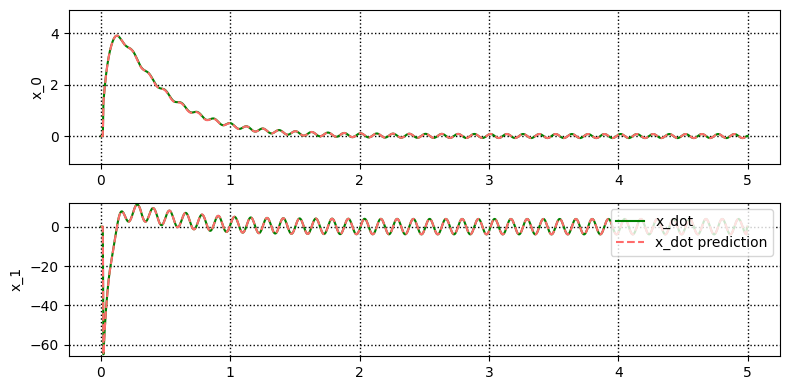

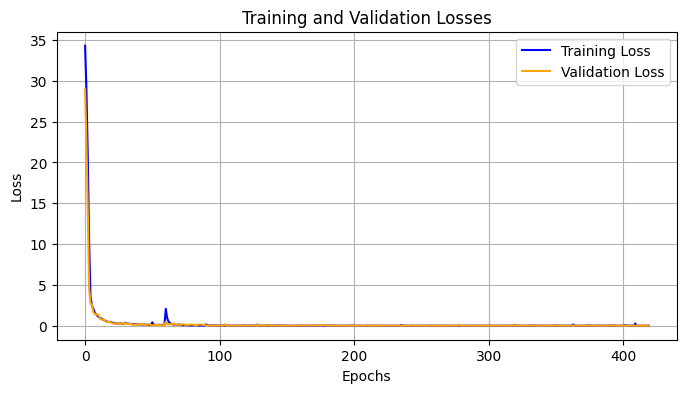

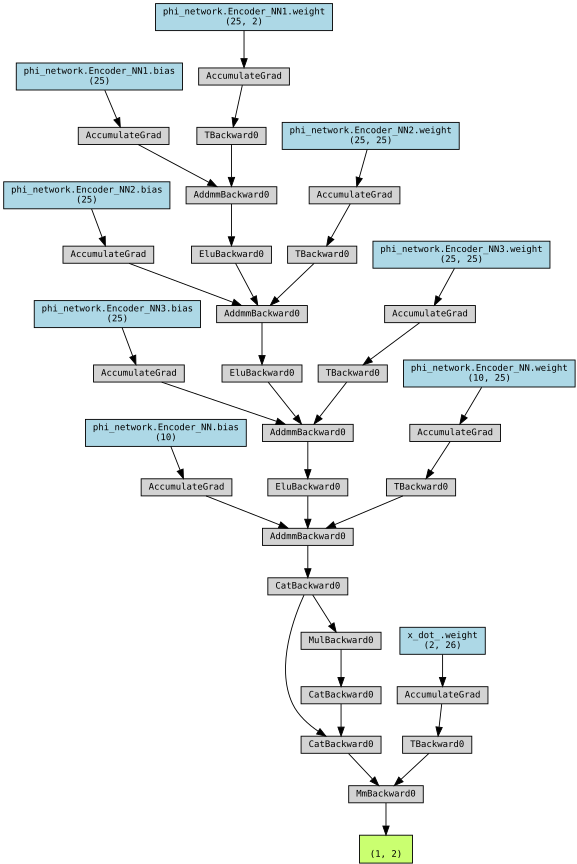

In [6]:
####  ATTENTION!! #######
#To run and generate these results, you should first run all the cells below:


# to Animate the learning process withing different episodes
animate_pendulum(summarized_list_observations)

#Plot the prediction and ground truth x_dot
Sim.graph_prediction()

# to Plot the validation and training loss over all of episodes 
NN_model.plot_validation_training_loss()

# Display the graph of the NN model of the system based on Phi network
display(dot)




# Classes and Functions to be used later in the main loop:

In [1]:
import numpy as np
import matplotlib.pyplot as plt


import os


from functools import partial
from scipy.integrate import solve_ivp


import os
from datetime import datetime
# from user_layer import RBFLayer, InitCentersRandom

from datetime import datetime

import torch
import torch.nn as nn
import torch.optim as optim
import torch.utils.data


class Pendulum():
    def __init__(self, m=0.33, g=9.81):
        self.dim_n = 2
        self.dim_m = 1
        self.measure_dim = 2
        self.x = np.zeros((self.dim_n))
        self.x_dot = np.zeros((self.dim_n))
        self.measure = np.zeros((self.measure_dim))
        self.Domain = [-np.pi, np.pi, -4*np.pi,4*np.pi ]

    def integrate(self, u, t_interval):
        dx_dt = partial(self.dynamics, u=u)
        sol = solve_ivp(dx_dt, t_interval, self.x, method='RK45', t_eval=None, rtol=1e-6, atol=1e-6, dense_output=False,
                        events=None, vectorized=False)
        self.x = sol.y[..., -1]
        # return partial(self.dynamics, u=u)

    def dynamics(self, t, x, u):
        m = 0.1
        l = 0.5
        k = 0.1
        x1, x2 = x

        x1_d = -x2
        x2_d=-(9.8/l)*np.sin(x1)-(k/m)*x2+(1/(m*l**2))*u[0]
        # x2_d = -(9.8 / l) * (x1) - (k / m) * x2 + (1 / (m * l ** 2)) * u
        return [x1_d, x2_d]

    def Read_sensor(self):
        # self.x[0] = (self.x[0] + np.pi) % (2 * np.pi) - np.pi  # Wrap x1 to be between -pi and pi
        return self.x  # self.x[0]


    def In_domain(self, x):
        in_dom = True
        for i in range(self.dim_n):
            if (x[i] < self.Domain[2 * i]) | (x[i] > self.Domain[2 * i + 1]):
                in_dom = False
                print("x[{}]={} is out of range[{},{}]".format(i, x[i], self.Domain[2 * i], self.Domain[2 * i + 1]))
        return in_dom

    def randomly_initialize(self,num_of_episode,j):
        x_init = np.zeros((self.dim_n,num_of_episode))
        # Set the seed for reproducibility
        seed_ = [42,65] 
        for i in range(self.dim_n):
            np.random.seed(seed_[i]) 
            x_init[i] = np.random.uniform(self.Domain[2 * i], self.Domain[2 * i + 1], size=num_of_episode)
        x_init[1,:] *= 0.1
        self.x = np.copy(x_init[:,j])
        return x_init[:,j]
    
class Library():
    def __init__(self, chosen_bases, Lib_setting, measure_dim, m):
        self.chosen_bases = chosen_bases
        self.Lib_setting = Lib_setting
        self.n = measure_dim
        self.m = m

        if 'NN' in self.chosen_bases:
            self._Phi_lbl = ['NN']
            self._Phi_dim = self.n + Lib_setting['number_of nonlinear_basis'] + 1
        else:
            self._Phi_lbl = []
            for i in self.chosen_bases:
                self._Phi_lbl.extend(self.lib_labels[i])
            self._Phi_dim = len(self._Phi_lbl)
        # reserve the memeory required to evaluate Phi
        self._Phi_res = np.zeros((self._Phi_dim))
        # reserve the memeory required to evaluate pPhi
        self._pPhi_res = np.zeros((self._Phi_dim, self.n))

    def build_lbl(self, func_name):
        lbl = []
        for i in range(self.n):
            index = func_name.find('x')
            lbl.append(func_name[:index + 1] + '({})'.format(i + 1) + func_name[index + 1:])
        return lbl

    def _Phi_(self, x):
        i = 0
        for key in self.chosen_bases:
            temp = int(self.lib_dims[key])
            self._Phi_res[i:i + temp] = self.lib[key](x)
            i += temp
        return self._Phi_res

    def _pPhi_(self, x):
        i = 0
        for key in self.chosen_bases:
            temp = int(self.lib_dims[key])
            self._pPhi_res[i:i + temp, :] = self.plib[key](x)
            i += temp
        return self._pPhi_res



# Define the Phi network as a separate module
class PhiNetwork(nn.Module):
    def __init__(self, n, number_of_nonlinear_basis):
        super(PhiNetwork, self).__init__()
        
        self.len_phi = 1+ n + number_of_nonlinear_basis
        
        # Define the encoder layers for the Phi network
        self.Encoder_NN1 = nn.Linear(n, 25)
        self.Encoder_NN2 = nn.Linear(25, 25)
        self.Encoder_NN3 = nn.Linear(25, 25)
        self.Encoder_NN = nn.Linear(25, number_of_nonlinear_basis)

        self.elu = nn.ELU()

    def forward(self, x):
        Encoder_NN1_out = self.elu(self.Encoder_NN1(x))
        Encoder_NN2_out = self.elu(self.Encoder_NN2(Encoder_NN1_out))
        Encoder_NN3_out = self.elu(self.Encoder_NN3(Encoder_NN2_out))
        Encoder_NN_out = self.Encoder_NN(Encoder_NN3_out)
        
        # Get the batch size from x
        batch_size = x.size(0)

        # Define linear_base as a tensor of ones with shape (batch_size, 1)
        linear_base = torch.ones(batch_size, 1)
        Phi = torch.cat([linear_base,x, Encoder_NN_out], dim=1)
        return Phi

class JacobianCalculator:
    def __init__(self, phi_network):
        self.phi_network = phi_network
        self.n = phi_network.Encoder_NN1.in_features
        self.len_phi = phi_network.len_phi

        # Pre-compute weight matrices
        self.W1 = phi_network.Encoder_NN1.weight
        self.W2 = phi_network.Encoder_NN2.weight
        self.W3 = phi_network.Encoder_NN3.weight
        self.W4 = phi_network.Encoder_NN.weight

    def elu_derivative(self, x):
        return torch.where(x > 0, torch.ones_like(x), torch.exp(x))

    def calculate(self, x):
        batch_size = x.shape[0]
        
        # Initialize the Jacobian tensor
        jacobian = torch.zeros(batch_size, self.len_phi, self.n, device=x.device)
        
        # Identity matrix for the first n rows (corresponding to x)
        jacobian[:, 1:self.n+1, :] = torch.eye(self.n, device=x.device).unsqueeze(0).repeat(batch_size, 1, 1)
        
        # Forward pass to get intermediate values
        z1 = self.phi_network.Encoder_NN1(x)
        a1 = self.phi_network.elu(z1)
        z2 = self.phi_network.Encoder_NN2(a1)
        a2 = self.phi_network.elu(z2)
        z3 = self.phi_network.Encoder_NN3(a2)
        a3 = self.phi_network.elu(z3)
        
        # Compute derivatives
        da3_dz3 = torch.diag_embed(self.elu_derivative(z3))
        da2_dz2 = torch.diag_embed(self.elu_derivative(z2))
        da1_dz1 = torch.diag_embed(self.elu_derivative(z1))
        
        # Chain rule to get the Jacobian of the nonlinear part
        J = self.W4.unsqueeze(0).repeat(batch_size, 1, 1)
        J = J.bmm(da3_dz3)
        J = J.bmm(self.W3.unsqueeze(0).repeat(batch_size, 1, 1))
        J = J.bmm(da2_dz2)
        J = J.bmm(self.W2.unsqueeze(0).repeat(batch_size, 1, 1))
        J = J.bmm(da1_dz1)
        J = J.bmm(self.W1.unsqueeze(0).repeat(batch_size, 1, 1))
        
        # Add the nonlinear part to the Jacobian
        jacobian[:, self.n+1:, :] = J
        
        return jacobian

class CustomModel(nn.Module):
    def __init__(self, n, m, number_of_nonlinear_basis, DB_training, DB_validation):
        super(CustomModel, self).__init__()
        
        self.n = n
        self.m = m
        self.number_of_nonlinear_basis = number_of_nonlinear_basis
        self.DB_training = DB_training  # Assume self.DB_training.read() is given
        self.DB_validation = DB_validation  # Assume self.DB_validation.read() is given
        
        # Calculate len_phi directly
        self.len_phi = 1 + self.n + number_of_nonlinear_basis
        
        # Define the Phi network and gradients
        self.phi_network = PhiNetwork(n, number_of_nonlinear_basis)
        self.jacobian_calc = JacobianCalculator(self.phi_network)

        
        # Linear layer for x_dot_ 
        self.x_dot_ = nn.Linear(self.len_phi +  self.len_phi * m, n, bias=False)

        # Define loss and optimizer
        self.criterion = nn.MSELoss()
        self.optimizer = optim.Adam(self.parameters())

        self.train_losses = []
        self.val_losses = []

    def forward(self, x, u):
        Phi = self.phi_network(x)  # Shape: (batch_size, len_phi)

        # Initialize UxPhi as an empty list to collect results
        UxPhi_list = []

        # Compute each u[i] * Phi
        for i in range(u.size(1)):  # Loop over the number of elements in u
            UxPhi_list.append(u[:, i].unsqueeze(1) * Phi)  # Shape: (batch_size, len_phi)

        # Concatenate along the last dimension to form UxPhi
        UxPhi = torch.cat(UxPhi_list, dim=1)  # Shape: (batch_size, m * len_phi)

        # Now concatenate Phi, u, and UxPhi
        Theta_phi = torch.cat([Phi, UxPhi], dim=1)  # Shape: (batch_size, len_phi + m + m * len_phi)

        # Compute the next state
        x_dot_ = self.x_dot_(Theta_phi)  # Final output
        return x_dot_
    
    def get_x_dot__weights(self):
        return self.x_dot_.weight

    # Training method
    def train_model(self, epochs=30, batch_size=15):
        
        # Training loop
        for epoch in range(epochs):
            # Read training data from DB
            _, _, input_data, out_data = self.DB_training.read()
            
            if len(out_data) > batch_size:
                # Convert input data and output data to tensors
                input_data = torch.tensor(input_data, dtype=torch.float32)
                out_data = torch.tensor(out_data, dtype=torch.float32)

                # Create dataset and dataloader for training
                train_dataset = torch.utils.data.TensorDataset(input_data[:, :self.n], 
                                                               input_data[:, self.n:], 
                                                               out_data)
                train_dataloader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)

                # Training step
                epoch_loss = 0.0
                for x, u, y in train_dataloader:
                    # Zero the gradients
                    self.optimizer.zero_grad()
                    # Forward pass
                    output = self(x, u)

                    # Compute the loss
                    loss = self.criterion(output, y)

                    # Backward pass and optimization
                    loss.backward()
                    self.optimizer.step()

                    epoch_loss += loss.item()

                self.train_losses.append(epoch_loss / len(train_dataloader))

                # Validate the model
                val_loss = self.validate_model(batch_size)
                self.val_losses.append(val_loss)

                # Print the loss for each epoch
                print(f'Epoch {epoch+1}, Train Loss: {self.train_losses[-1]}, Validation Loss: {val_loss}')

        return self.train_losses, self.val_losses
    def plot_validation_training_loss(self):
        # Plotting the training and validation losses
        plt.figure(figsize=(8, 4))
        plt.plot(self.train_losses, label='Training Loss', color='blue')
        plt.plot(self.val_losses, label='Validation Loss', color='orange')
        plt.title('Training and Validation Losses')
        plt.xlabel('Epochs')
        plt.ylabel('Loss')
        plt.legend()
        plt.grid()
        plt.show()

    # Validation method
    def validate_model(self, batch_size=15):
        self.eval()  # Set the model to evaluation mode
        val_loss = 0.0
        
        # Read validation data from DB
        _, _, input_data, out_data = self.DB_validation.read()
        val_dataloader = []
        if len(out_data) > batch_size:
            input_data = torch.tensor(input_data, dtype=torch.float32)
            out_data = torch.tensor(out_data, dtype=torch.float32)

            # Create dataset and dataloader for validation
            val_dataset = torch.utils.data.TensorDataset(input_data[:, :self.n], 
                                                         input_data[:, self.n:], 
                                                         out_data)
            val_dataloader = torch.utils.data.DataLoader(val_dataset, batch_size=batch_size, shuffle=False)

            # Validation step
            with torch.no_grad():  # No gradients needed for validation
                for x, u, y in val_dataloader:
                    output = self(x, u)
                    loss = self.criterion(output, y)
                    val_loss += loss.item()

        return val_loss / len(val_dataloader) if len(val_dataloader) > 0 else float('inf')
    
    def get_Phi_pPhi(self,x):
        return self.phi_network(x), self.jacobian_calc.calculate(x)

class Database():
    def __init__(self, db_dim, Theta_dim, output_dir_path, Lib, load=True, save=True):
        self.db_dim = db_dim
        self.output_dir_path = output_dir_path
        self.Lib = Lib
        # self.n=self.Lib.n
        self._Phi_dim = self.Lib._Phi_dim
        self.Theta_dim = Theta_dim
        self.save = save
        self.load = load
        self.db_index = 0

        if load & os.path.exists(self.output_dir_path + '/db_Theta.npy'):
            self.db_Theta = np.load(self.output_dir_path + '/db_Theta.npy')
            self.db_X_dot = np.load(self.output_dir_path + '/db_X_dot.npy')
            self.db_overflow = np.load(self.output_dir_path + '/db_overflow.npy')
            self.input_data = np.load(self.output_dir_path + '/db_input_data.npy')
            self.out_data = np.load(self.output_dir_path + '/db_out_data.npy')

            self.db_index = np.load(output_dir_path + '/db_index.npy')
            # self.db_overflow=np.load(output_dir_path+'/db_overflow.npy')
        else:
            self.Lib = Lib
            self.db_Theta = np.zeros((Theta_dim, self.db_dim))
            self.db_X_dot = np.zeros((self.Lib.n, self.db_dim))

            self.input_data = np.zeros((self.Lib.n + self.Lib.m,self.db_dim))
            self.out_data = np.zeros((self.Lib.n,self.db_dim))

            self.db_overflow = False
            self.db_index = 0

    def add(self, x, x_dot, u):
        self.out_data[:,self.db_index]=x_dot
        self.input_data[:self.Lib.n,self.db_index]=x
        self.input_data[self.Lib.n:,self.db_index]=u

        if 0:
            self.db_X_dot[:, self.db_index] = x_dot
            _Phi_ = self.Lib._Phi_(x)
            self.db_Theta[:self._Phi_dim, self.db_index] = _Phi_
            for im in range(self.Lib.m):
                self.db_Theta[self._Phi_dim * (im + 1):self._Phi_dim * (im + 2), self.db_index] = _Phi_ * u[im]
        self.db_index += 1
        if self.db_index > (self.db_dim - 1):
            self.db_overflow = True
            self.db_index = 0

    def read(self):
        if self.db_overflow:
            db = [self.db_Theta, self.db_X_dot,self.input_data.T,self.out_data.T]
        else:
            db = [self.db_Theta[:, :self.db_index], self.db_X_dot[:, :self.db_index],self.input_data[:, :self.db_index].T,self.out_data[:, :self.db_index].T]
        return db

    def DB_save(self):
        if self.save:
            np.save(self.output_dir_path + '/db_Theta.npy', self.db_Theta)
            np.save(self.output_dir_path + '/db_X_dot.npy', self.db_X_dot)
            np.save(self.output_dir_path + '/db_index.npy', self.db_index)
            np.save(self.output_dir_path + '/db_overflow.npy', self.db_overflow)

            np.save(self.output_dir_path + '/db_input_data.npy', self.input_data)
            np.save(self.output_dir_path + '/db_out_data.npy', self.out_data)


class Objective():
    def __init__(self, Q, R, gamma):
        self.gamma = gamma
        self.Q = Q
        self.R = R

    def stage_cost(self, x, u):
        return np.matmul(np.matmul(x, Q), x) + np.matmul(np.matmul(u, R), u)
    

class SimResults():
    def __init__(self, t, Lib, DB, output_dir_path, select={'states': 1, 'value': 1, 'P': 1, 'error': 1}):
        self.t = t
        len_t = len(t)
        self.Lib = Lib
        self.DB = DB

        self.x_s_history = np.zeros((self.Lib.n, len_t))
        self.u_history = np.zeros((self.Lib.m, len_t))
        self.P_history = np.zeros((len_t, self.Lib._Phi_dim, self.Lib._Phi_dim))
        self.P_norm_history = np.zeros((len_t, 1, 1))
        self.V_history = np.zeros((len_t))
        self.error_history = np.zeros((len_t))
        self.x_dot_hat_history=np.zeros((self.Lib.n,len_t))
        self.x_dot_approx_history=np.zeros((self.Lib.n,len_t))
        self.select = select
        self.output_dir_path = output_dir_path
        self.pallet = ['r', 'g', 'b', 'm', '#E67E22', '#1F618D']
        self.list_stacked_P = []

    def record(self, i, x, u, P, V, error,x_dot_hat,x_dot_approx):
        self.x_s_history[:, i] = x
        self.u_history[:, i] = u
        self.P_norm_history[i] = np.linalg.norm(P)
        self.P_history[i] = P
        self.V_history[i] = V
        self.error_history[i] = error
        self.x_dot_hat_history[:,i]=x_dot_hat
        self.x_dot_approx_history[:,i]=x_dot_approx

    def graph(self, j, i):
        # >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>PLOT<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
        # plot: the components of matrix 'Pk' vs. 'time' #######################################
        px = self.Lib._Phi_dim
        if self.select['P']:
            reshaped_P = self.P_history.reshape(self.P_history.shape[0], -1)
            self.list_stacked_P.append(reshaped_P[:-3].copy())
            fig = plt.figure()
            plt.grid(color='k', linestyle=':', linewidth=1)
            plt.plot(np.concatenate(self.list_stacked_P, axis=0))
            plt.title('History of Value Paramters')
            plt.savefig(self.output_dir_path + '/fig_P{}.pdf'.format(j+1))
            plt.close(fig)
            plt.show()
            

        # plot the 'control' + 'states' of the system vs. 'time' ################################
        if self.select['states']:
            fig1 = plt.figure()
            for im in range(self.Lib.m):
                plt.plot(self.t[:i], self.u_history[im, :i], 'c--')
            for ii in range(self.Lib.n):
                plt.plot(self.t[:i], self.x_s_history[ii, :i], self.pallet[ii % len(self.pallet)])

            plt.legend(["Control", "Angle", "Angular Velocity", "Position", "Velocity"], loc=1)
            plt.xlabel('t (sec)')
            plt.ylabel('States and Control')
            # plt.tight_layout()
            plt.ylim((-10, 10))

            plt.grid(color='k', linestyle=':', linewidth=1)
            plt.savefig(self.output_dir_path + '/fig_states_control{}.pdf'.format(j+1), format='pdf')
            plt.close(fig1)
            plt.show()

            # plot the 'x_dot_hat' + 'x_dot_approx' vs. 'time' ################################
            fig0, axs = plt.subplots(self.Lib.n, 1)
            for ii in range(self.Lib.n):
                axs[ii].plot(self.t[:i], self.x_dot_approx_history[ii, :i], 'g')
                axs[ii].plot(self.t[:i], self.x_dot_hat_history[ii, :i], color='#FF6B6B', linestyle='--')
                # axs[0].set_xlabel('time')
                axs[ii].set_ylabel('x_{}'.format(ii))
                axs[ii].grid(color='k', linestyle=':', linewidth=1)
                axs[ii].set_ylim(
                    [np.amin(self.x_dot_approx_history[ii, :i]) - 1, np.amax(self.x_dot_approx_history[ii, :i]) + 1])

            plt.legend(["x_dot", "x_dot prediction"], loc=1)

            plt.tight_layout()
            plt.savefig(self.output_dir_path + '/fig_estimation_comp{}.pdf'.format(j+1), format='pdf')
            plt.close(fig0)
            plt.show()

    def graph_prediction(self):
             # plot the 'x_dot_hat' + 'x_dot_approx' vs. 'time' ################################
            fig0, axs = plt.subplots(self.Lib.n, 1,figsize=(8, 4))
            for ii in range(self.Lib.n):
                axs[ii].plot(self.t[:], self.x_dot_approx_history[ii, :], 'g')
                axs[ii].plot(self.t[:], self.x_dot_hat_history[ii, :], color='#FF6B6B', linestyle='--')
                # axs[0].set_xlabel('time')
                axs[ii].set_ylabel('x_{}'.format(ii))
                axs[ii].grid(color='k', linestyle=':', linewidth=1)
                axs[ii].set_ylim(
                    [np.amin(self.x_dot_approx_history[ii, :]) - 1, np.amax(self.x_dot_approx_history[ii, :]) + 1])

            plt.legend(["x_dot", "x_dot prediction"], loc=1)

            plt.tight_layout()
            plt.show()


    
class Control():
    def __init__(self, h, Objective, Lib, P_init):
        self.Objective = Objective
        self.Lib = Lib
        self.Qb = np.zeros((self.Lib._Phi_dim, self.Lib._Phi_dim))
        self.Qb[1:self.Lib.n + 1, 1:self.Lib.n + 1] = self.Objective.Q
        self.P = P_init
        self.h = h
        self.update_P = 1
        self.Phi=np.zeros(self.Lib._Phi_dim)
        self.Phi[0]=1
        self.pPhi=np.zeros((self.Lib._Phi_dim,self.Lib.n))

    def integrate_P_dot(self, x, Wt,Phi, pPhi,k, sparsify):
        # self.Phi = self.Lib._Phi_(x)
        # self.pPhi = self.Lib._pPhi_(x)
        self.Phi= Phi
        self.pPhi= pPhi

        dp_dt = partial(self.P_dot, x=x, Wt=Wt)
        sol=solve_ivp(dp_dt,[0, k*self.h], self.P.flatten(), method='RK45', t_eval=None,rtol=10, atol=10, dense_output=False, events=None, vectorized=False,max_step=0.02)

        if sol.status == -1:
            self.P *= 0
            # print('Reset occuried...!')
        else:
            self.P = sol.y[..., -1].reshape((self.Lib._Phi_dim, self.Lib._Phi_dim))


    def P_dot(self, t, P, x, Wt):
        P = P.reshape((self.Lib._Phi_dim, self.Lib._Phi_dim))
        # P[0,0]=0
        # x[1]=utils.rad_regu(x[1])
        # x[2]=utils.rad_regu(x[2])
        W = Wt[:, :self.Lib._Phi_dim]
        SIGMA = np.zeros((self.Lib._Phi_dim, self.Lib._Phi_dim))
        # Wc=Wt[:,self.Lib._Phi_dim:]

        P_pPhi_W = np.matmul(np.matmul(P, self.pPhi), W)
        for im in range(self.Lib.m):
            P_pPhi_Wcj_Phi = np.matmul(np.matmul(P, self.pPhi),
                                       np.matmul(Wt[:, self.Lib._Phi_dim * (im + 1):self.Lib._Phi_dim * (im + 2)],
                                                 self.Phi))
            SIGMA += 1 / self.Objective.R[im, im] * np.outer(P_pPhi_Wcj_Phi, P_pPhi_Wcj_Phi)
        out = ((self.Qb - SIGMA + P_pPhi_W + P_pPhi_W.T - self.Objective.gamma * P) * self.update_P)

        return out.flatten()

    def calculate(self, x, Wt,P_ctrl, u_lim):
        u = np.zeros((self.Lib.m))
        for im in range(self.Lib.m):
            u[im] = -(1 / self.Objective.R[im, im]) * np.matmul(self.Phi,
                                                                np.matmul(np.matmul(P_ctrl, self.pPhi),
                                                                          np.matmul(Wt[:, self.Lib._Phi_dim * (
                                                                                  im + 1):self.Lib._Phi_dim * (
                                                                                  im + 2)], self.Phi)))
        u = np.clip(u, -u_lim[0], u_lim[0])
        # u[1]=np.clip(u[1], -u_lim[1], u_lim[1])
        return u

    def value(self, x):
        # self.Phi = self.Lib._Phi_(x)
        return np.matmul(np.matmul(self.Phi, self.P), self.Phi)

    def regulate(self, u_des, u):
        self.Objective.R[0, 0] = (abs(u) / abs(u_des)) * self.Objective.R[0, 0]
        return self.Objective.R

# Function to convert a tensor to a NumPy array, checking device first
def tensor_to_numpy(tensor_):
    # Check if the tensor is on GPU
    if tensor_.is_cuda:
        # Move tensor to CPU before converting to NumPy array
        return tensor_.detach().cpu().numpy()[0]
    else:
        # If it's already on CPU, directly convert to NumPy array
        return tensor_.detach().numpy()[0]

def numpy_to_tensor(numpy_):
    tensor_ = torch.tensor(numpy_,dtype=torch.float32)
    tensor_ = tensor_.unsqueeze(0)
    return tensor_

def weight_to_numpy(weight):
    # Check if the tensor is on GPU
    if weight.is_cuda:
        # Move tensor to CPU before converting to NumPy array
        return weight.detach().cpu().numpy()
    else:
        # If it's already on CPU, directly convert to NumPy array
        return weight.detach().numpy()



# Initialization of Paramters and Classes

In [2]:
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'

output_dir_path = 'log'
try:
    os.makedirs(output_dir_path)
except FileExistsError:
    print('The directory already exists')


# Choose the Identification algorithm
select_ID_algorithm = {'SINDy': 0, 'RLS': 0, 'Least Squares': 0, 'Gradient Descent': 0,
                       'Neural Network': 1}  
select_output_graphs = {'states': 1, 'value': 0, 'P': 0}
# To be used for labeling the output results' directory



# system specifications
Sys_Model = Pendulum()
n = Sys_Model.dim_n
m = Sys_Model.dim_m
Domain = Sys_Model.Domain

# choosing and initaializing the Librery of bases
chosen_bases = ['NN']
Lib_setting = {'number_of nonlinear_basis':10}
measure_dim = Sys_Model.measure_dim
Lib = Library(chosen_bases, Lib_setting, measure_dim, m)
p = Lib._Phi_dim
Theta_dim = (m + 1) * p

# Building a Database
db_dim = 2000
Database_4training = Database(db_dim=db_dim, Theta_dim=Theta_dim, output_dir_path=output_dir_path, Lib=Lib, load=1,
                            save=1)
Database_4validation= Database(db_dim=db_dim, Theta_dim=Theta_dim, output_dir_path=output_dir_path, Lib=Lib, load=1,
                            save=1)
X_buf = np.zeros((measure_dim, 5))
U_buf = np.zeros((m, 3))
Theta_buf = np.zeros((Theta_dim, 5))

# Define and initialize the Identification System Model
SysID_Weights = np.ones((measure_dim, Theta_dim)) * 0.000
# SysID = SysID_dmd(select_ID_algorithm, Database_4training, SysID_Weights, Lib)

# Instantiate the model
NN_model = CustomModel(n=n, m=m, number_of_nonlinear_basis=10, 
                    DB_training=Database_4training, DB_validation=Database_4validation)
# SysID_Weights = SysID.Weights
# dx_dt= partial(double_pend_cart.dynamics, u=0)
num_of_episode = 15
# duration of simulation
t_end = 5
# sampling time
h = 0.005  # 0.01
# time grid points
t = np.arange(0, t_end + h, h)

# To characterise the performance measure
R = np.diag([5])
Q = np.diag([10, 1])
gamma = 0.9
Obj = Objective(Q, R, gamma)

# Tracking reference
x_ref = np.zeros((measure_dim))

# # Define the controller
Controller = Control(h, Objective=Obj, Lib=Lib, P_init=np.zeros((p, p)))
u_lim = [10]

The directory already exists


# Summary of the main loop of the code:

This code is part of a simulation that integrates a control system with a neural network-based system identification model. It runs over several episodes (`num_of_episode`) and multiple time steps (`t`) within each episode. Here's a breakdown of the key components and flow:

1. **Initialization:**
   - The control input `u` is initialized to zeros.
   - The system state is randomly initialized using `Sys_Model.randomly_initialize()`.
   - State derivatives (`x_dot_approx`, `x_dot_hat`) and error arrays are initialized to store system behavior and prediction errors.

2. **Neural Network Update:**
   - If the episode is beyond the first, the system identification (SysID) neural network (`SysID.NNmodel`) is updated using `SysID.update_DNN()`.

3. **System Simulation:**
   - For each time step within an episode, the code:
     - Integrates the system state based on the control input.
     - Reads sensor data and compares it with a reference state (`x_ref`).
     - Buffers past states and control inputs for further analysis.
     - If the state goes out of the domain, the loop breaks.

4. **State Derivative Estimation and Neural Network Prediction:**
   - After a few time steps, the approximate state derivative (`x_dot_approx`) is calculated.
   - The neural network model is used to predict the state derivative (`x_dot_hat`), and the error between the predicted and approximate values is computed.
   - If the error exceeds a threshold, the new data is added to the database (`Database.add()`).

5. **Controller Update:**
   - The control matrix `P` is updated using `Controller.integrate_P_dot()` based on the state error, neural network weights, and basis functions.
   - Control input `u` is updated using the controller's calculation and a perturbation is added to avoid local minima.

6. **Logging and Diagnostics:**
   - Periodically, the code logs progress, prints predicted states, and compares predictions with actual system dynamics.

7. **Data Saving and Plotting:**
   - After each episode, the database is saved and a graph of the results is generated.



In [3]:
# Simulation results
Sim = SimResults(t, Lib, Database, select=select_output_graphs, output_dir_path=output_dir_path)

list_observ_episodes=[]

# Loop through each episode for training/evaluation
for j in range(num_of_episode):
    
    # Initialize control input and system state
    u = np.zeros(m)  # Control input initialization
    x_init = Sys_Model.randomly_initialize(num_of_episode,j)  # Randomly initialize the system state
    print(x_init)
    # Initialize variables for state derivatives and errors
    x_dot_approx = np.zeros(measure_dim)  # Approximate state derivative
    x_dot_hat = torch.zeros(measure_dim)     # Estimated state derivative from the model
    error = np.zeros(len(t))              # Error array to track differences

    # Update the Deep Neural Network (DNN) if not the first episode
    if j > 0:
        NN_model.train_model()  # Update the neural network model

    # Prepare dimensions and weights for the neural network
    NN_Theta_dim = Theta_dim  # Dimension of the neural network parameters
    NN_based_weights = np.zeros((NN_Theta_dim, NN_Theta_dim))  # Initialize weights matrix
    
    # Set weights for the system dynamics model from the neural network
    # NN_based_weights[1:n + 1, 1:] = SysID.get_x_dot__weights()
    SysID_Weights = weight_to_numpy(NN_model.get_x_dot__weights())  # Extract system ID weights


    print(f'\n\n>>>>>>>>>>>>>>>> Episode {j+1} of {num_of_episode}:\n')
    # Loop through each time step for simulation
    for i in range(len(t) - 2):
        
        # Integrate the system using the control input
        Sys_Model.integrate(u, [t[i], t[i + 1]])
        sample = Sys_Model.Read_sensor()  # Read the current sensor sample
        x_s = sample   # Compute the state error

        # Buffer the last state and control inputs
        X_buf = np.roll(X_buf, -1)  # Shift buffer to make space for new data
        X_buf[:, -1] = x_s          # Store the current state in the buffer
        U_buf = np.roll(U_buf, -1)  # Shift control input buffer
        U_buf[:, -1] = u            # Store the current control input in the buffer

        # Check if the sample is within the valid domain
        if not Sys_Model.In_domain(sample):
            print('OUT OF DOMAIN')
            break  # Exit if the sample is out of domain

        # If enough past samples are available, compute derivatives
        if i > 3:
            # Approximate the state derivative
            x_dot_approx = (X_buf[:, -1] - X_buf[:, -2]) / h  
            
            # Predict the state derivative using the neural network
            x_dot_hat = NN_model(
                numpy_to_tensor(X_buf[:, -2]), numpy_to_tensor(U_buf[:, -1].reshape(m))
            )
            
            # Calculate the error between approximate and predicted state derivatives
            error[i] = np.linalg.norm(x_dot_approx - tensor_to_numpy(x_dot_hat))
            
            # Check if the error exceeds a threshold (adaptive learning)
            if error[i] > 0.9 * np.mean(error[:i]):
                # Add the new data point to the database if error is significant
                if np.random.choice([True, False], p=[0.9, 0.1]):
                    Database_4training.add(X_buf[:, -2], x_dot_approx, U_buf[:, -1])
                else:
                    Database_4validation.add(X_buf[:, -2], x_dot_approx, U_buf[:, -1])

        # Get the basis functions for system identification
        Phi, pPhi = NN_model.get_Phi_pPhi(numpy_to_tensor(X_buf[:, -1]))
        Phi = tensor_to_numpy(Phi)
        pPhi = tensor_to_numpy(pPhi)
        # Integrate the controller's internal parameter matrix
        Controller.integrate_P_dot(x_s, SysID_Weights, Phi, pPhi, k=0.01, sparsify=False)
        
        # Record simulation data for analysis
        Sim.record(i, sample, u, Controller.P, Controller.value(x_s), error[i], tensor_to_numpy(x_dot_hat), x_dot_approx)
        
        # Calculate control input based on the current state
        if i % 50 == 0: 
            P_ctrl = Controller.P  # Store current controller parameters
        u[0] = Controller.calculate(x_s, SysID_Weights, P_ctrl, u_lim)  # Calculate control input
        u[0] += 0.1 * np.sin(50 * t[i])  # Add perturbation to the control input

        # Print progress and diagnostic information at intervals
        if i % 150 == 0:
            print('\n', '>>>>>>>>' * 10, 'progress={:4.1f}%'.format(i / len(t) * 100))


    # Save database and model state after all episodes
    Database_4training.DB_save()
    # SysID.save()  # Save the system ID model state if needed
    Sim.graph(j, i)  # Generate graphs for the current episode
    list_observ_episodes.append(Sim.x_s_history[:,:i].copy())
    Sim.x_s_history *= 0



[-0.78828768 -0.70712211]


>>>>>>>>>>>>>>>> Episode 1 of 15:


 >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>> progress= 0.0%
x[0]=-3.1506236466542665 is out of range[-3.141592653589793,3.141592653589793]
OUT OF DOMAIN


/tmp/ipykernel_575749/3122702990.py:85: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  u[0] = Controller.calculate(x_s, SysID_Weights, P_ctrl, u_lim)  # Calculate control input


[ 2.83192151 -1.17771342]
Epoch 1, Train Loss: 34.30393652595691, Validation Loss: 29.028300102522124
Epoch 2, Train Loss: 28.870412730458956, Validation Loss: 22.476176098878703
Epoch 3, Train Loss: 20.772908007031056, Validation Loss: 14.114193955464149
Epoch 4, Train Loss: 10.355534397844059, Validation Loss: 4.546349383001007
Epoch 5, Train Loss: 3.5709301869371046, Validation Loss: 2.7833560647915547
Epoch 6, Train Loss: 2.5284532321922817, Validation Loss: 2.572719703664753
Epoch 7, Train Loss: 2.1279015316447216, Validation Loss: 1.7405294555781492
Epoch 8, Train Loss: 1.6972721926311949, Validation Loss: 1.454948780634232
Epoch 9, Train Loss: 1.4305817316939582, Validation Loss: 1.4186140941594965
Epoch 10, Train Loss: 1.2479616114452703, Validation Loss: 1.3360798666218936
Epoch 11, Train Loss: 1.089645460359196, Validation Loss: 1.3577134705968756
Epoch 12, Train Loss: 0.9698730343535765, Validation Loss: 0.8693404787553669
Epoch 13, Train Loss: 0.885697336839651, Validation 

/tmp/ipykernel_575749/3122702990.py:85: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  u[0] = Controller.calculate(x_s, SysID_Weights, P_ctrl, u_lim)  # Calculate control input


[ 1.45766093 -0.53501253]
Epoch 1, Train Loss: 0.3759078395956043, Validation Loss: 0.3324113343981331
Epoch 2, Train Loss: 0.2714099301331079, Validation Loss: 0.1921662928131687
Epoch 3, Train Loss: 0.23963817751118496, Validation Loss: 0.20946802331982597
Epoch 4, Train Loss: 0.25585725183473595, Validation Loss: 0.2017652512938062
Epoch 5, Train Loss: 0.2041971561457239, Validation Loss: 0.21342474221140703
Epoch 6, Train Loss: 0.1980778840231473, Validation Loss: 0.16405358167413844
Epoch 7, Train Loss: 0.21081844382266055, Validation Loss: 0.10659521990829258
Epoch 8, Train Loss: 0.20318010377127732, Validation Loss: 0.15937498140708306
Epoch 9, Train Loss: 0.16453568510877997, Validation Loss: 0.1385144371271773
Epoch 10, Train Loss: 0.15688619515233077, Validation Loss: 0.09431892472020448
Epoch 11, Train Loss: 0.17778254386538, Validation Loss: 0.24281089513826726
Epoch 12, Train Loss: 0.17833318215892163, Validation Loss: 0.17984426544576104
Epoch 13, Train Loss: 0.1423476533

/tmp/ipykernel_575749/3122702990.py:85: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  u[0] = Controller.calculate(x_s, SysID_Weights, P_ctrl, u_lim)  # Calculate control input


[ 0.61988954 -0.82273372]
Epoch 1, Train Loss: 2.0765309033553994, Validation Loss: 0.4684307200125238
Epoch 2, Train Loss: 0.9414723356768712, Validation Loss: 0.22985745049707257
Epoch 3, Train Loss: 0.5206260186995366, Validation Loss: 0.16990725952895608
Epoch 4, Train Loss: 0.35171205116741694, Validation Loss: 0.168429980417644
Epoch 5, Train Loss: 0.22340458003220273, Validation Loss: 0.22788277610444896
Epoch 6, Train Loss: 0.18809277346051895, Validation Loss: 0.10115559958138698
Epoch 7, Train Loss: 0.13490381595720327, Validation Loss: 0.29646740251766135
Epoch 8, Train Loss: 0.12485951805876484, Validation Loss: 0.1436479890363077
Epoch 9, Train Loss: 0.108595340186035, Validation Loss: 0.11142039832002275
Epoch 10, Train Loss: 0.11015728322455465, Validation Loss: 0.12877257129328618
Epoch 11, Train Loss: 0.17571181454348253, Validation Loss: 0.16304921507774575
Epoch 12, Train Loss: 0.08306950239339538, Validation Loss: 0.10160021328214389
Epoch 13, Train Loss: 0.06929240

/tmp/ipykernel_575749/3122702990.py:85: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  u[0] = Controller.calculate(x_s, SysID_Weights, P_ctrl, u_lim)  # Calculate control input



 >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>> progress=30.0%

 >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>> progress=45.0%

 >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>> progress=59.9%

 >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>> progress=74.9%

 >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>> progress=89.9%
[-2.16129862 -0.49416905]
Epoch 1, Train Loss: 0.16065003599193114, Validation Loss: 0.02898936648147247
Epoch 2, Train Loss: 0.06649014451749512, Validation Loss: 0.03125574149996296
Epoch 3, Train Loss: 0.04179040211558675, Validation Loss: 0.02121612522273269
Epoch 4, Train Loss: 0.04580251290462911, Validation Loss: 0.03792385161622365
Epoch 5, Train Loss: 0.03304351571731881, Validation Loss: 0.028099513735510097
Epoch 6, Train Loss: 0.0319551611597191, Validation Loss: 0.03132238390780777
Epoch 7, T

/tmp/ipykernel_575749/3122702990.py:85: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  u[0] = Controller.calculate(x_s, SysID_Weights, P_ctrl, u_lim)  # Calculate control input



 >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>> progress=30.0%

 >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>> progress=45.0%

 >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>> progress=59.9%

 >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>> progress=74.9%

 >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>> progress=89.9%
[-2.16145018 -0.84709848]
Epoch 1, Train Loss: 0.008713330517509091, Validation Loss: 0.018732730649131935
Epoch 2, Train Loss: 0.015394907110238642, Validation Loss: 0.01258427573773235
Epoch 3, Train Loss: 0.013638754289270616, Validation Loss: 0.012912941209385702
Epoch 4, Train Loss: 0.019175975459259448, Validation Loss: 0.0410206767764297
Epoch 5, Train Loss: 0.012869284405727495, Validation Loss: 0.013574608856186441
Epoch 6, Train Loss: 0.02263514302521527, Validation Loss: 0.05730529242358518
Epo

/tmp/ipykernel_575749/3122702990.py:85: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  u[0] = Controller.calculate(x_s, SysID_Weights, P_ctrl, u_lim)  # Calculate control input



 >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>> progress=30.0%

 >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>> progress=45.0%

 >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>> progress=59.9%

 >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>> progress=74.9%

 >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>> progress=89.9%
[-2.77664256  0.5009301 ]
Epoch 1, Train Loss: 0.01178083081995554, Validation Loss: 0.010262334582672446
Epoch 2, Train Loss: 0.005506851875445625, Validation Loss: 0.014858283757728631
Epoch 3, Train Loss: 0.007052264367438742, Validation Loss: 0.007914052657616227
Epoch 4, Train Loss: 0.005065490324884209, Validation Loss: 0.011503720075793285
Epoch 5, Train Loss: 0.004349789485976503, Validation Loss: 0.016360385863391905
Epoch 6, Train Loss: 0.008198972208487955, Validation Loss: 0.014860702981409372

/tmp/ipykernel_575749/3122702990.py:85: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  u[0] = Controller.calculate(x_s, SysID_Weights, P_ctrl, u_lim)  # Calculate control input



 >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>> progress=30.0%

 >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>> progress=45.0%

 >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>> progress=59.9%

 >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>> progress=74.9%

 >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>> progress=89.9%
[2.30075258 0.68238115]
Epoch 1, Train Loss: 0.03462567211844639, Validation Loss: 0.011885106874153768
Epoch 2, Train Loss: 0.01593477431590905, Validation Loss: 0.018679665085345284
Epoch 3, Train Loss: 0.007209471757905974, Validation Loss: 0.011642201133584952
Epoch 4, Train Loss: 0.06347767280505053, Validation Loss: 0.07981029299779364
Epoch 5, Train Loss: 0.03174317246928478, Validation Loss: 0.009179698764767893
Epoch 6, Train Loss: 0.004038685116979446, Validation Loss: 0.0077088438341780235
Epoc

/tmp/ipykernel_575749/3122702990.py:85: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  u[0] = Controller.calculate(x_s, SysID_Weights, P_ctrl, u_lim)  # Calculate control input



 >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>> progress=30.0%

 >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>> progress=45.0%

 >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>> progress=59.9%

 >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>> progress=74.9%

 >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>> progress=89.9%
[0.63532436 0.03657429]
Epoch 1, Train Loss: 0.03857256462554267, Validation Loss: 0.12124076035892792
Epoch 2, Train Loss: 0.007054733633717049, Validation Loss: 0.009157788457388906
Epoch 3, Train Loss: 0.0024558299135524473, Validation Loss: 0.01003019460898289
Epoch 4, Train Loss: 0.002471301902942151, Validation Loss: 0.01588624425700678
Epoch 5, Train Loss: 0.002643017967947439, Validation Loss: 0.017383842339333922
Epoch 6, Train Loss: 0.002837319175952545, Validation Loss: 0.007648714146147432
Epo

/tmp/ipykernel_575749/3122702990.py:85: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  u[0] = Controller.calculate(x_s, SysID_Weights, P_ctrl, u_lim)  # Calculate control input



 >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>> progress=30.0%

 >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>> progress=45.0%

 >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>> progress=59.9%

 >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>> progress=74.9%

 >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>> progress=89.9%
[ 1.30735856 -0.66398971]
Epoch 1, Train Loss: 0.0012582999108091636, Validation Loss: 0.007144504483791812
Epoch 2, Train Loss: 0.0014659311367614097, Validation Loss: 0.008161564282172141
Epoch 3, Train Loss: 0.0018186018085055082, Validation Loss: 0.00641253145843607
Epoch 4, Train Loss: 0.007439052026263619, Validation Loss: 0.06760904059872212
Epoch 5, Train Loss: 0.012683043357179458, Validation Loss: 0.006354820802277858
Epoch 6, Train Loss: 0.0017788788784163267, Validation Loss: 0.009940567364293

/tmp/ipykernel_575749/3122702990.py:85: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  u[0] = Controller.calculate(x_s, SysID_Weights, P_ctrl, u_lim)  # Calculate control input



 >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>> progress=30.0%

 >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>> progress=45.0%

 >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>> progress=59.9%

 >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>> progress=74.9%

 >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>> progress=89.9%
[-3.01225646 -0.67848442]
Epoch 1, Train Loss: 0.008727935276823048, Validation Loss: 0.019009490336904845
Epoch 2, Train Loss: 0.016955602010573025, Validation Loss: 0.00819248289700403
Epoch 3, Train Loss: 0.002828471504960647, Validation Loss: 0.017037913841677573
Epoch 4, Train Loss: 0.003825099615566085, Validation Loss: 0.010127927346894439
Epoch 5, Train Loss: 0.0011014960372408699, Validation Loss: 0.010457718984872005
Epoch 6, Train Loss: 0.009892499168601526, Validation Loss: 0.03225901147330904

/tmp/ipykernel_575749/3122702990.py:85: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  u[0] = Controller.calculate(x_s, SysID_Weights, P_ctrl, u_lim)  # Calculate control input



 >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>> progress=15.0%

 >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>> progress=30.0%

 >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>> progress=45.0%

 >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>> progress=59.9%

 >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>> progress=74.9%

 >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>> progress=89.9%
[2.95253068 0.01436378]
Epoch 1, Train Loss: 0.08350990339983325, Validation Loss: 0.12241300110750374
Epoch 2, Train Loss: 0.02574962560467964, Validation Loss: 0.011315047136000131
Epoch 3, Train Loss: 0.0020619037299618513, Validation Loss: 0.009811284353010923
Epoch 4, Train Loss: 0.0029579255589389994, Validation Loss: 0.010318465288295177
Epoch 5, Train Loss: 0.0014753268485186873, Validation Loss: 0.00

/tmp/ipykernel_575749/3122702990.py:85: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  u[0] = Controller.calculate(x_s, SysID_Weights, P_ctrl, u_lim)  # Calculate control input



 >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>> progress=30.0%

 >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>> progress=45.0%

 >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>> progress=59.9%

 >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>> progress=74.9%

 >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>> progress=89.9%
[ 2.08879872 -0.91939347]
Epoch 1, Train Loss: 0.02525118292038287, Validation Loss: 0.0098166326995906
Epoch 2, Train Loss: 0.014762887748569917, Validation Loss: 0.03403847619831221
Epoch 3, Train Loss: 0.01810465797472662, Validation Loss: 0.010629320372070435
Epoch 4, Train Loss: 0.008907264406938772, Validation Loss: 0.021748014798069915
Epoch 5, Train Loss: 0.019598222279455513, Validation Loss: 0.02433504852980598
Epoch 6, Train Loss: 0.005148712576474689, Validation Loss: 0.01840982468851806
Epoch

/tmp/ipykernel_575749/3122702990.py:85: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  u[0] = Controller.calculate(x_s, SysID_Weights, P_ctrl, u_lim)  # Calculate control input



 >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>> progress=30.0%

 >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>> progress=45.0%

 >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>> progress=59.9%

 >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>> progress=74.9%

 >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>> progress=89.9%
[-1.80742667  0.15447152]
Epoch 1, Train Loss: 0.005835314153141078, Validation Loss: 0.005774028894698696
Epoch 2, Train Loss: 0.0061988242360617295, Validation Loss: 0.035659288913671816
Epoch 3, Train Loss: 0.05959323470727471, Validation Loss: 0.018408671865689764
Epoch 4, Train Loss: 0.14719487147565596, Validation Loss: 0.01688411550468973
Epoch 5, Train Loss: 0.008679515627862663, Validation Loss: 0.0060785011754168365
Epoch 6, Train Loss: 0.0019865318428665926, Validation Loss: 0.00475368028552830

/tmp/ipykernel_575749/3122702990.py:85: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  u[0] = Controller.calculate(x_s, SysID_Weights, P_ctrl, u_lim)  # Calculate control input



 >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>> progress=30.0%

 >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>> progress=45.0%

 >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>> progress=59.9%

 >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>> progress=74.9%

 >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>> progress=89.9%
[-1.99915269 -0.04523842]
Epoch 1, Train Loss: 0.05671571513443296, Validation Loss: 0.03438218855542311
Epoch 2, Train Loss: 0.010293598165613975, Validation Loss: 0.013522375536841035
Epoch 3, Train Loss: 0.0103330979399112, Validation Loss: 0.008680024975302644
Epoch 4, Train Loss: 0.02203599292543411, Validation Loss: 0.1247289933823744
Epoch 5, Train Loss: 0.03911387737763962, Validation Loss: 0.005817868422191982
Epoch 6, Train Loss: 0.005173475458004352, Validation Loss: 0.025148391399581208
Epoch 

/tmp/ipykernel_575749/3122702990.py:85: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  u[0] = Controller.calculate(x_s, SysID_Weights, P_ctrl, u_lim)  # Calculate control input



 >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>> progress=30.0%

 >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>> progress=45.0%

 >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>> progress=59.9%

 >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>> progress=74.9%

 >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>> progress=89.9%


In [4]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML, display

def animate_pendulum(signals, rows=2, cols=5):
    """
    Animate multiple pendulum motions with given control angle signals.
    
    Parameters:
        signals (list of arrays): List of angle signals, one for each pendulum
        rows (int): Number of rows in the subplot grid
        cols (int): Number of columns in the subplot grid
    """
    # Length of the pendulum and time configuration
    length = 1.0
    dt = h
    time = np.arange(0, t_end, dt)
    print(len(time))


    fig, axes = plt.subplots(rows, cols, figsize=(cols * 4, rows * 4))
    fig.subplots_adjust(hspace=0.5, wspace=0.5)  # Space between plots
    
    # Flatten axes to easily index for each signal
    axes = np.array(axes).flatten() if rows * cols > 1 else [axes]
    
    # Store line objects for each subplot to update during animation
    lines = []
    for i,ax in enumerate(axes):
        ax.set_xticks([])
        ax.set_yticks([])
        ax.set_facecolor('#F0F4F8')
        ax.set_xlim(-length - 0.1, length + 0.1)
        ax.set_ylim(-length - 0.1, length + 0.1)
        ax.set_title(f"Run #{i+1}")

         # Add dashed vertical line from [0, 0] to [0, 1]
        ax.plot([0, 0], [0, 1], linestyle='--', color='red', linewidth=1)

        line, = ax.plot([], [], 'o-', lw=2)
        lines.append(line)

    def init():
        for line in lines:
            line.set_data([], [])
        return lines

    def update(frame):
        for i, x_sig in enumerate(signals):
            # Check if the frame index is within the bounds of the current signal's length
            if frame < (x_sig.shape[1]):  # Assuming x_sig is a 2D array
                angle_sig = x_sig[0, :]
                x = length * np.sin(angle_sig[frame])
                y = length * np.cos(angle_sig[frame])
                lines[i].set_data([0, x], [0, y])
                lines[i].set_linewidth(20)
                lines[i].set_solid_capstyle('round')
                lines[i].set_color('#2A9D8F')

        return lines


    ani = FuncAnimation(fig, update, frames=int(len(time)/3), init_func=init, blit=True, interval=dt * 1000, repeat=True)
    plt.close(fig)
    
    # Get the HTML and modify for autoplay
    html_str = ani.to_jshtml()
    modified_html = html_str.replace(
        'this.timer = null;',
        'this.timer = null; this.play_animation();'
    )
    display(HTML(modified_html))

# print(list_observ_episodes[0][0,:5])
# print(list_observ_episodes[1][0,:5])
# df
# print([i[0].shape for i in list_observ_episodes])
# df
summarized_list_observations=[ep[:,::3] for ep in list_observ_episodes[:10]]


In [5]:
import torch
from torchviz import make_dot
from IPython.display import Image, display

# Assuming NN_model is defined somewhere as your neural network model
x = torch.randn(1, 2)  # Replace with appropriate input size
u = torch.randn(1, 1)  # Replace with appropriate input size
model = NN_model  # Replace with your model

# Forward pass to get the output
y = model(x, u)

# Create a graph using make_dot
dot = make_dot(y, params=dict(model.named_parameters()))


